In [1]:
## Project Research Question:
#----------------------------------------------
##**Can we build a machine learning model to predict whether a patient is experiencing an epileptic seizure based on EEG signals?**##

In [2]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.feature_selection import SelectKBest, f_classif, RFE
from sklearn.metrics import (accuracy_score, classification_report, 
                           confusion_matrix, roc_curve, auc, 
                           precision_recall_curve, average_precision_score)
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from collections import Counter
import warnings
warnings.filterwarnings('ignore')

In [3]:
# Load dataset
df = pd.read_csv('Epileptic Seizure Recognition.csv')

In [4]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33047 entries, 0 to 33046
Columns: 180 entries, Unnamed to y
dtypes: float64(12), int64(167), object(1)
memory usage: 45.4+ MB
None


In [5]:
# Check first few rows
df.head()

,Unnamed,X1,X2,X3,X4,X5,X6,X7,X8,X9,...,X170,X171,X172,X173,X174,X175,X176,X177,X178,y
0,X21.V1.791,135,190,229.0,223.0,192,125.0,55,-9.0,-33,...,-17,-15,-31,-77,-103,-127,-116,-83,-51,4
1,X15.V1.924,386,382,356.0,331.0,320,315.0,307,272.0,244,...,164,150,146,152,157,156,154,143,129,1
2,X8.V1.1,-32,-39,-47.0,-37.0,-32,-36.0,-57,-73.0,-85,...,57,64,48,19,-12,-30,-35,-35,-36,5
3,X16.V1.60,-105,-101,-96.0,NaN,-89,-95.0,-102,-100.0,-87,...,-82,-81,-80,-77,-85,-77,-72,-69,-65,5
4,X20.V1.54,-9,-65,-98.0,-102.0,-78,-48.0,-16,0.0,-21,...,4,2,-12,-32,-41,-65,-83,-89,-73,5


In [6]:
#Drop the ID column
df = df.drop(['Unnamed'], axis=1)

In [7]:
# Check missing values
print(df.isnull().sum())

X1      0
X2      0
X3      1
X4      1
X5      0
       ..
X175    0
X176    0
X177    0
X178    0
y       0
Length: 179, dtype: int64


In [8]:
# Describe numerical features
print(df.describe())

                 X1            X2            X3            X4            X5  \
count  33047.000000  33047.000000  33046.000000  33046.000000  33047.000000   
mean     -11.730323    -11.046752    -10.318859     -9.290807     -8.167186   
std      165.504877    165.760154    163.179672    160.927668    160.664803   
min    -1839.000000  -1838.000000  -1835.000000  -1845.000000  -1791.000000   
25%      -54.000000    -55.000000    -55.000000    -54.000000    -54.000000   
50%       -8.000000     -8.000000     -7.000000     -8.000000     -8.000000   
75%       34.000000     35.000000     36.000000     36.000000     35.000000   
max     1726.000000   1713.000000   1697.000000   1612.000000   1518.000000   

                 X6            X7            X8            X9           X10  \
count  33046.000000  33047.000000  33046.000000  33047.000000  33047.000000   
mean      -7.162440     -6.653130     -6.810537     -6.677853     -6.242201   
std      160.959305    161.059982    161.847590    

In [9]:
#Handle missing values (replace NaN with column mean)
df.fillna(df.mean(), inplace=True)

In [10]:
# Verify missing values are handled
print(df.isnull().sum())

X1      0
X2      0
X3      0
X4      0
X5      0
       ..
X175    0
X176    0
X177    0
X178    0
y       0
Length: 179, dtype: int64


In [11]:
# Assuming EEG data is in columns like 'X1', 'X2', ..., 'X178'
signal_cols = [col for col in df.columns if col.startswith('X')]

In [12]:
# Create new feature: mean EEG signal
df['mean_signal'] = df[signal_cols].mean(axis=1)

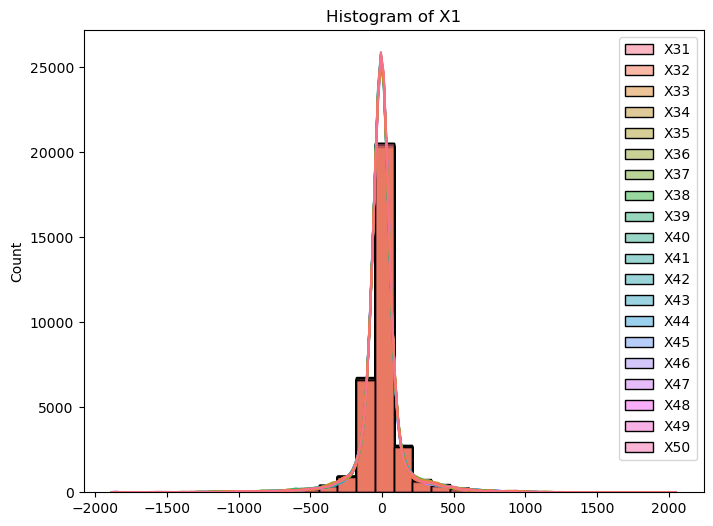

In [13]:
# histogram
plt.figure(figsize=(8,6))
sns.histplot(df[df.columns[30:50]], kde=True, bins=30)
plt.title(f'Histogram of {df.columns[0]}')
plt.show()

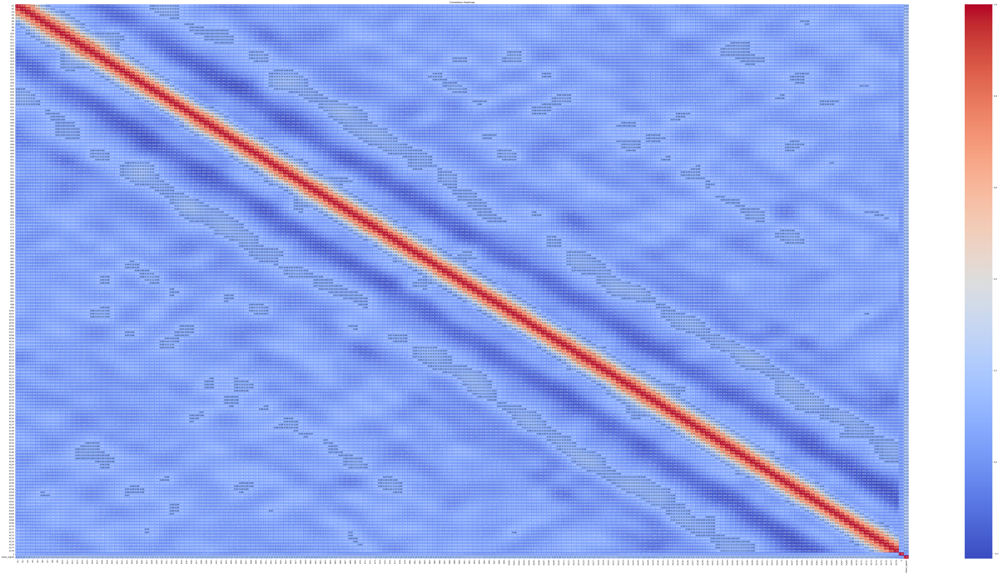

In [14]:
# heatmap
plt.figure(figsize=(100,50))
corr = df.corr()
sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

Text(0.5, 1.0, 'EEG Signal Distributions')

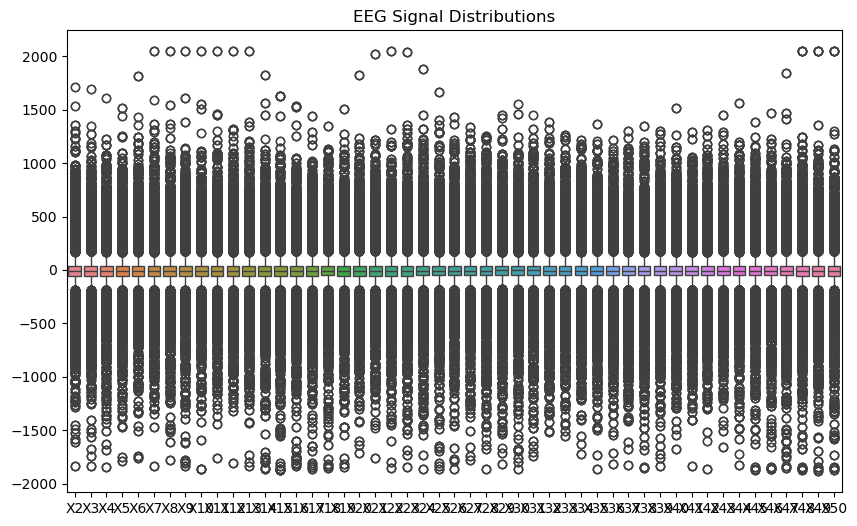

In [15]:
#box plot
plt.figure(figsize=(10, 6))
sns.boxplot(data=df.iloc[:, 1:50])  
plt.title("EEG Signal Distributions")

<Axes: >

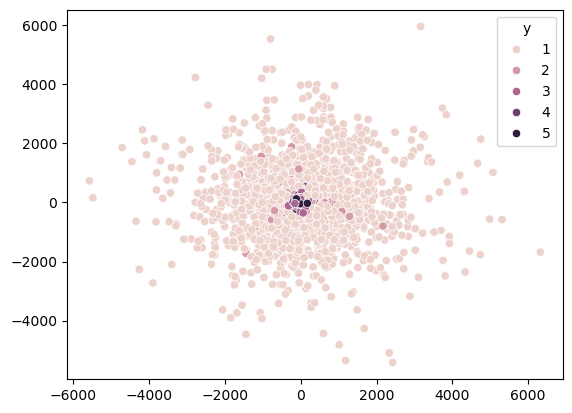

In [16]:
#pca plot
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(df.drop('y', axis=1))
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=df['y'])

Text(0.5, 1.0, 'Sample EEG Signal')

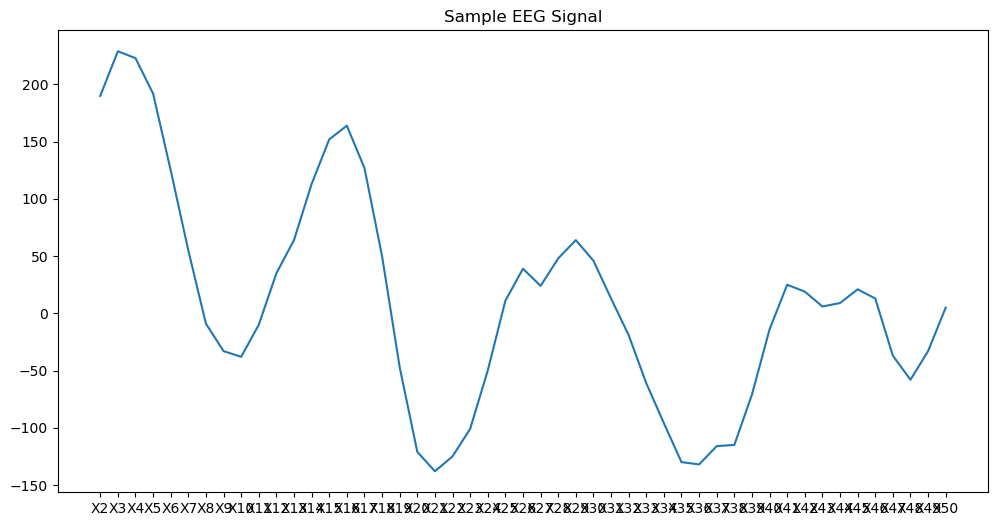

In [17]:
#signals plot
plt.figure(figsize=(12, 6))
plt.plot(df.iloc[0, 1:50])  
plt.title("Sample EEG Signal")


Target variable distribution:
y
2    0.200805
4    0.200502
3    0.199958
1    0.199564
5    0.199171
Name: proportion, dtype: float64


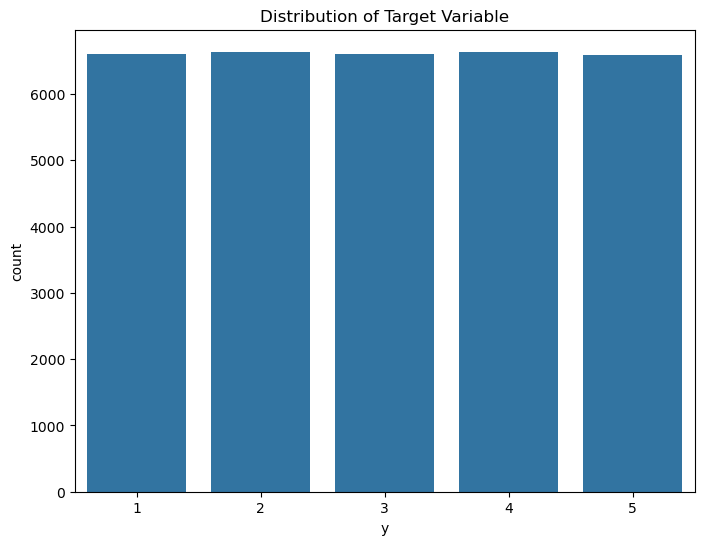

In [18]:
# Target Variable Analysis (assuming 'y' is target)
print("\nTarget variable distribution:")
print(df['y'].value_counts(normalize=True))

plt.figure(figsize=(8,6))
sns.countplot(x='y', data=df)
plt.title("Distribution of Target Variable")
plt.show()

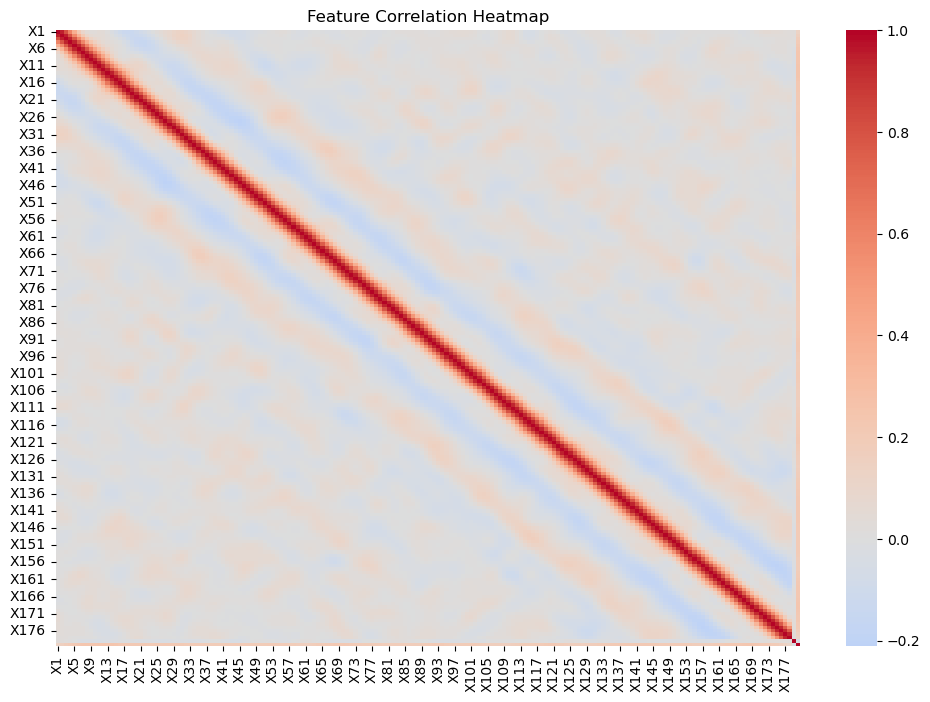

In [19]:
#Correlation Analysis
plt.figure(figsize=(12,8))
corr = df.corr()
sns.heatmap(corr, cmap='coolwarm', center=0)
plt.title("Feature Correlation Heatmap")
plt.show()

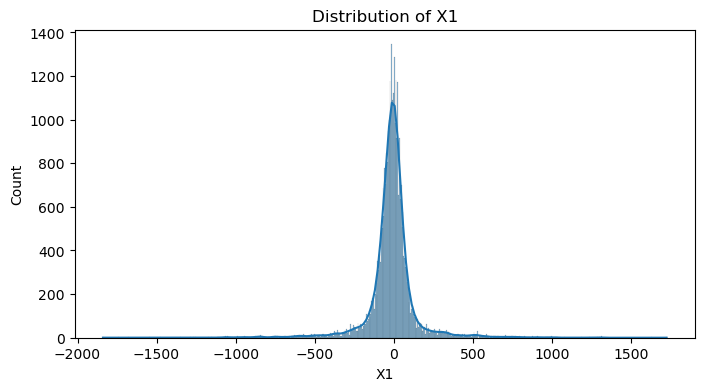

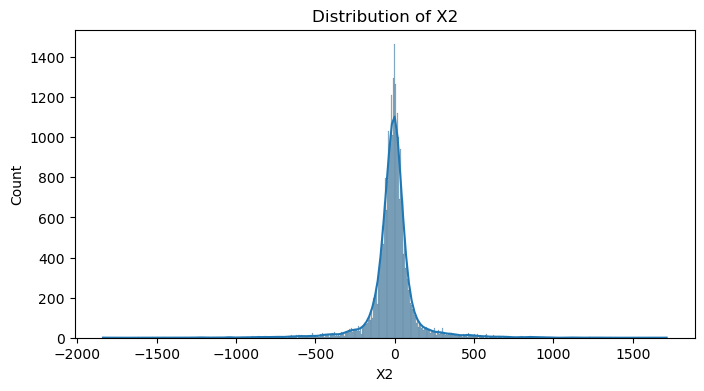

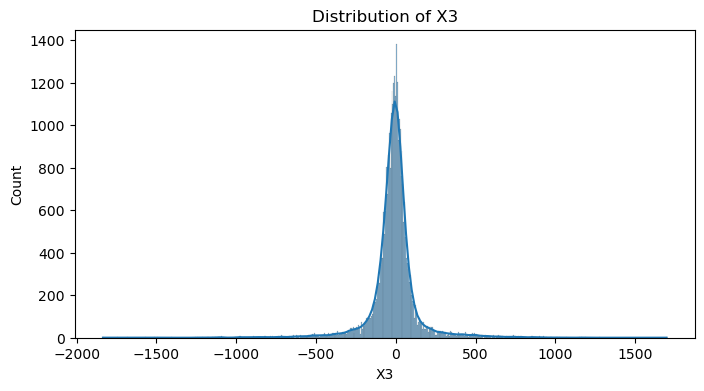

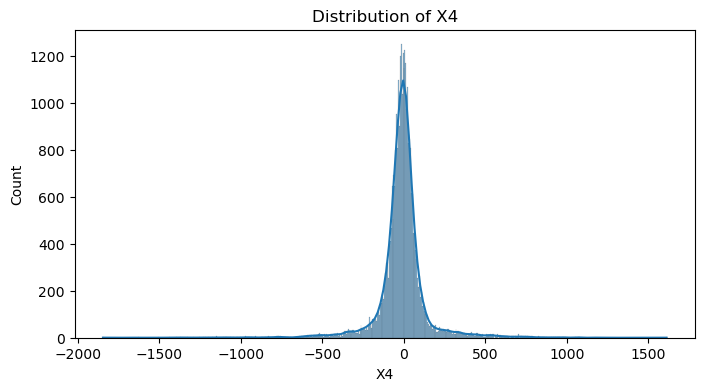

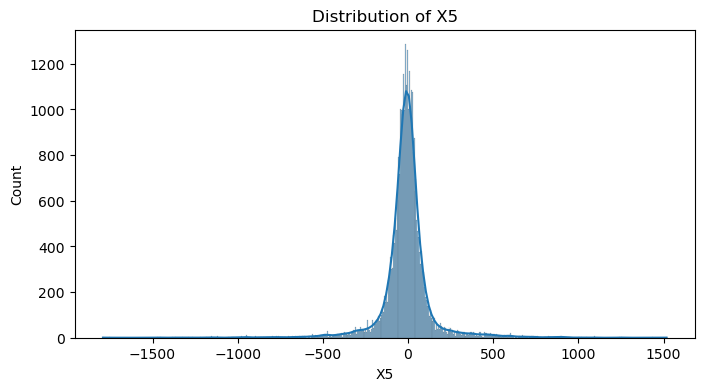

In [20]:
#Feature Distributions (univariate)
num_cols = df.select_dtypes(include=['int64','float64']).columns
for col in num_cols[:5]:  # First 5 numerical features
    plt.figure(figsize=(8,4))
    sns.histplot(df[col], kde=True)
    plt.title(f"Distribution of {col}")
    plt.show()

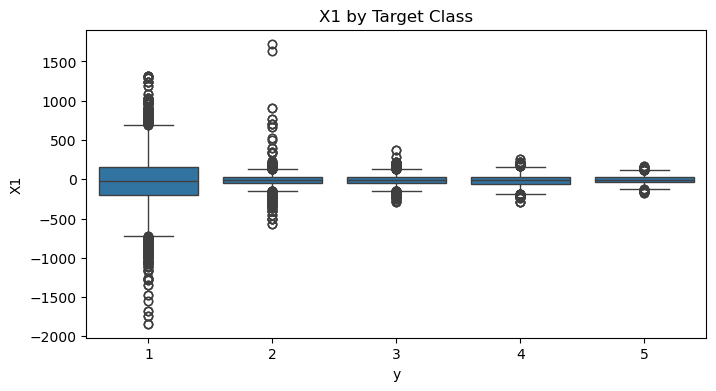

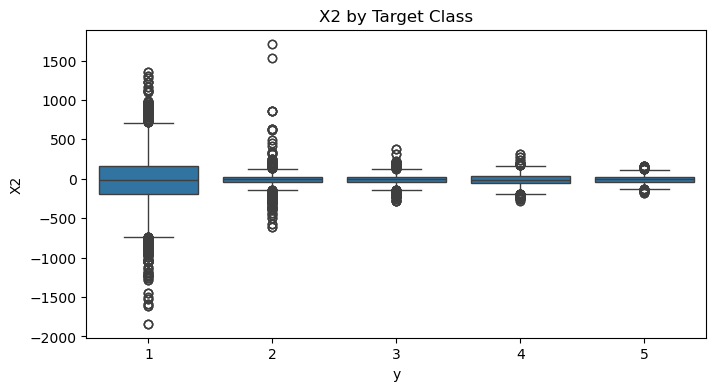

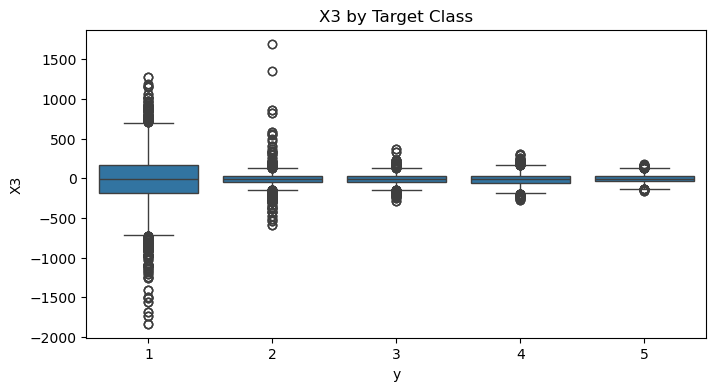

In [21]:
#Feature vs Target Analysis (bivariate)
for col in num_cols[:3]:  # First 3 features vs target
    plt.figure(figsize=(8,4))
    sns.boxplot(x='y', y=col, data=df)
    plt.title(f"{col} by Target Class")
    plt.show()

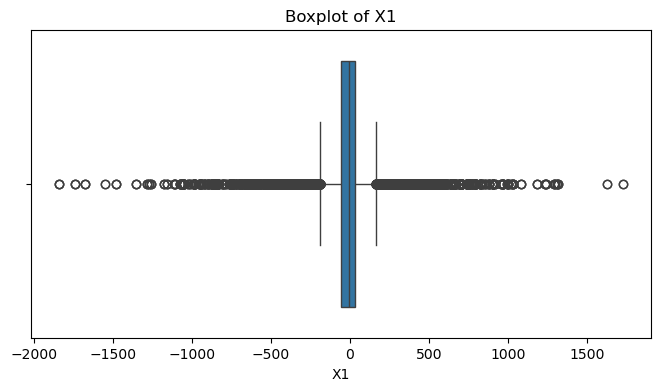

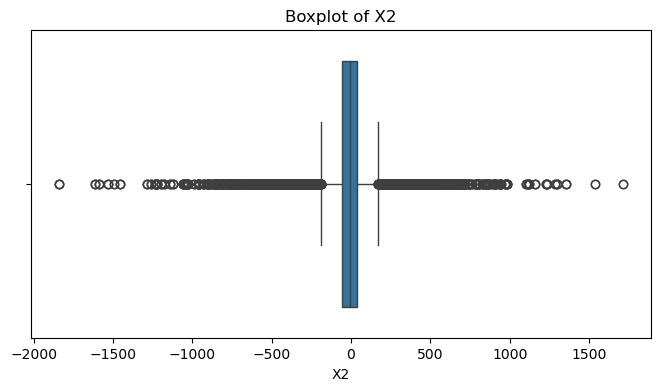

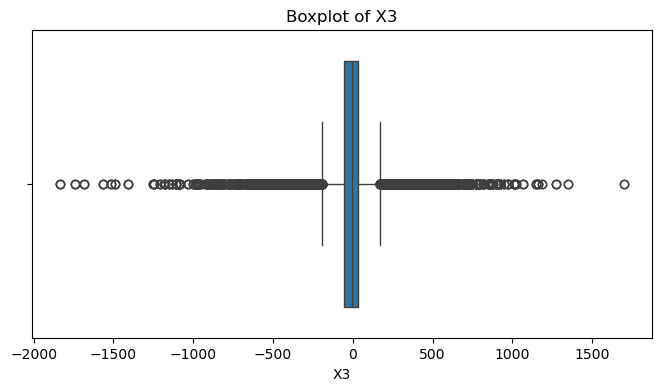

In [22]:
#Outlier Detection
for col in num_cols[:3]:
    plt.figure(figsize=(8,4))
    sns.boxplot(x=df[col])
    plt.title(f"Boxplot of {col}")
    plt.show()

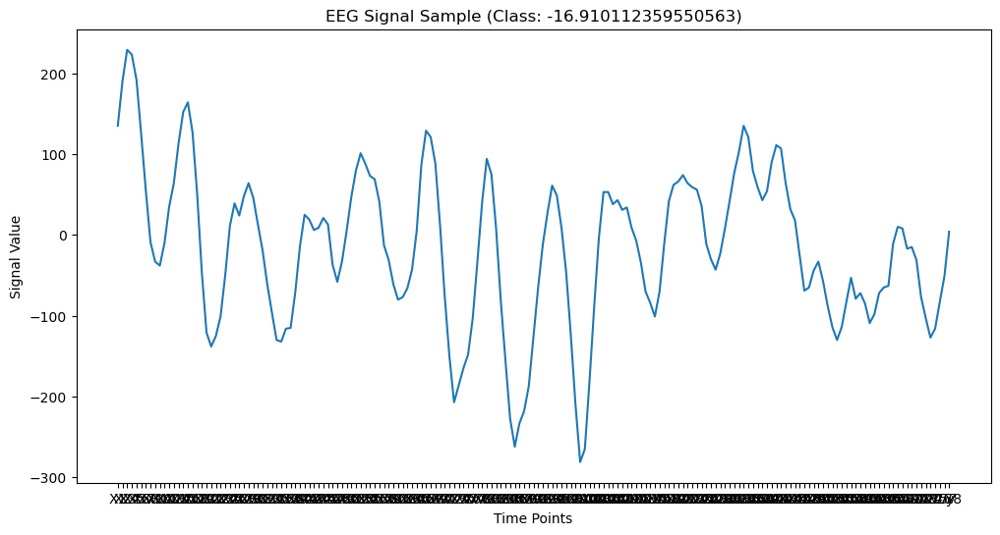

In [23]:
#Time Series Visualization (for EEG data)
plt.figure(figsize=(12,6))
sample_idx = 0  # First sample
plt.plot(df.iloc[sample_idx, :-1])  # All features except target
plt.title(f"EEG Signal Sample (Class: {df.iloc[sample_idx, -1]})")
plt.xlabel("Time Points")
plt.ylabel("Signal Value")
plt.show()

In [24]:
# Assuming y=1 is seizure and others are non-seizure
df['binary_label'] = df['y'].apply(lambda x: 1 if x == 1 else 0)

In [25]:
#Separate features and target
X = df.drop('y', axis=1)  
y = df['y']

In [26]:
# Remove constant features
X_non_constant = X.loc[:, (X != X.iloc[0]).any(axis=0)]

In [27]:
#Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [28]:
# Feature selection: Remove features with very low variance
from sklearn.feature_selection import VarianceThreshold
variance_threshold = 0.01  
selector_variance = VarianceThreshold(threshold=variance_threshold)
X_non_constant = selector_variance.fit_transform(X_scaled)

In [29]:
# Check the feature variances after variance thresholding
variances = np.var(X_non_constant, axis=0)
print(f"Min Variance: {np.min(variances)} | Max Variance: {np.max(variances)} | Mean Variance: {np.mean(variances)}")

Min Variance: 0.9999999999999996 | Max Variance: 1.0000000000000004 | Mean Variance: 1.0


In [30]:
# Scale the features after removing constant and low-variance features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_non_constant) 

In [31]:
# Feature selection: select top 20 features based on ANOVA F-test
selector_kbest = SelectKBest(score_func=f_classif, k=20)  
X_selected = selector_kbest.fit_transform(X_non_constant, y)

In [32]:
#Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_selected, y, test_size=0.2, random_state=42)

In [33]:
print(f"Shape of X_train: {X_train.shape} | Shape of X_test: {X_test.shape}")

Shape of X_train: (26437, 20) | Shape of X_test: (6610, 20)


In [34]:
# New feature: Mean EEG signal per sample
df['EEG_mean'] = df.iloc[:, 1:179].mean(axis=1)

In [35]:
correlations = df.corr()['y'].abs().sort_values(ascending=False)
top_features = correlations[1:11].index  # Top 10 features
X = df[top_features]
y = df['y']

In [36]:
#Initialize models
models = {
    'SVM': SVC(random_state=42),
    'DecisionTree': DecisionTreeClassifier(random_state=42),
    'KNN': KNeighborsClassifier(),
    'RandomForest': RandomForestClassifier(random_state=42),
    'LogisticRegression': LogisticRegression(max_iter=1000, random_state=42)
}


SVC
Confusion Matrix:
 [[1309    0    0    0    0]
 [   0  251  257  103  740]
 [   0  113  322   92  760]
 [   0  105  209  478  538]
 [   0   35  174   82 1042]]
Classification Report:
               precision    recall  f1-score   support

           1       1.00      1.00      1.00      1309
           2       0.50      0.19      0.27      1351
           3       0.33      0.25      0.29      1287
           4       0.63      0.36      0.46      1330
           5       0.34      0.78      0.47      1333

    accuracy                           0.51      6610
   macro avg       0.56      0.52      0.50      6610
weighted avg       0.56      0.51      0.50      6610

Accuracy: 0.5146747352496218


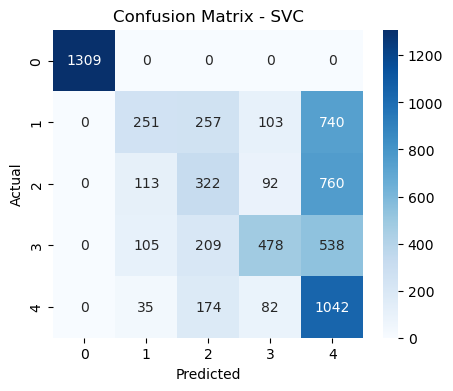

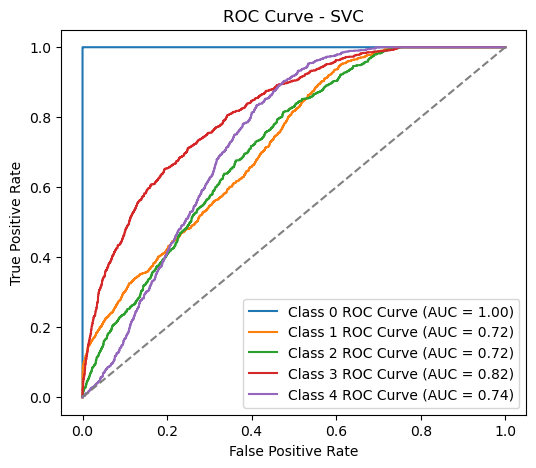

In [37]:
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import roc_curve, auc

# Define models dictionary with models (ensure to set probability=True for SVC)
models = {
    'SVC': SVC(probability=True),  
    
}

# Train + Evaluate
for name, model in models.items():
    # Fit the model on the training data
    model.fit(X_train, y_train)
    
    # Make predictions
    y_pred = model.predict(X_test)
    
    # Check if the model supports predict_proba
    if hasattr(model, 'predict_proba'):
        y_proba = model.predict_proba(X_test)  
    else:
        y_proba = None  

    # Metrics
    print(f"\n{name}")
    print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
    print("Classification Report:\n", classification_report(y_test, y_pred))
    print("Accuracy:", accuracy_score(y_test, y_pred))

    # Plot Confusion Matrix
    plt.figure(figsize=(5,4))
    sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix - {name}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

    # If the model supports `predict_proba`, plot ROC Curve
    if y_proba is not None:
        y_test_bin = label_binarize(y_test, classes=np.unique(y_test))  # Binarize the output labels

        # For each class, plot the ROC curve
        plt.figure(figsize=(6,5))
        for i in range(y_test_bin.shape[1]):
            fpr, tpr, thresholds = roc_curve(y_test_bin[:, i], y_proba[:, i])
            roc_auc = auc(fpr, tpr)
            plt.plot(fpr, tpr, label=f'Class {i} ROC Curve (AUC = {roc_auc:.2f})')

        plt.plot([0,1], [0,1], linestyle='--', color='gray')
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(f'ROC Curve - {name}')
        plt.legend()
        plt.show()


In [38]:
#GridSearchCV for SVM
param_grid_svm = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'rbf'],
    'gamma': ['scale', 'auto']
}

grid_search_svm = GridSearchCV(SVC(probability=True, random_state=42), param_grid_svm, cv=5, scoring='accuracy')
grid_search_svm.fit(X_train, y_train)

print("Best SVM Parameters")
print(grid_search_svm.best_params_)

Best SVM Parameters
{'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}


In [39]:
#Evaluate tuned SVM
best_svm = grid_search_svm.best_estimator_
best_pred = best_svm.predict(X_test)
best_proba = best_svm.predict_proba(X_test)[:,1]

print("\n=== Tuned SVM Results ===")
print("Confusion Matrix:\n", confusion_matrix(y_test, best_pred))
print("Classification Report:\n", classification_report(y_test, best_pred))
print("Accuracy:", accuracy_score(y_test, best_pred))


=== Tuned SVM Results ===
Confusion Matrix:
 [[1309    0    0    0    0]
 [   0  358  261   62  670]
 [   0  130  382   88  687]
 [   0   95  135  648  452]
 [   0   71  145  104 1013]]
Classification Report:
               precision    recall  f1-score   support

           1       1.00      1.00      1.00      1309
           2       0.55      0.26      0.36      1351
           3       0.41      0.30      0.35      1287
           4       0.72      0.49      0.58      1330
           5       0.36      0.76      0.49      1333

    accuracy                           0.56      6610
   macro avg       0.61      0.56      0.55      6610
weighted avg       0.61      0.56      0.55      6610

Accuracy: 0.5612708018154312


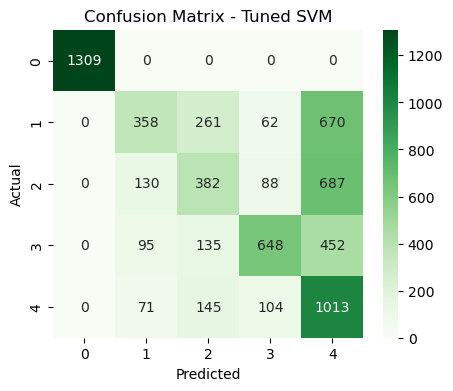

In [40]:
#Plot Confusion Matrix for tuned SVM
plt.figure(figsize=(5,4))
sns.heatmap(confusion_matrix(y_test, best_pred), annot=True, fmt='d', cmap='Greens')
plt.title('Confusion Matrix - Tuned SVM')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

(6610, 5)


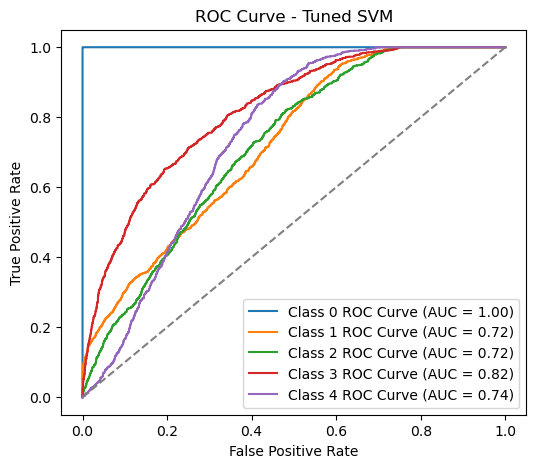

In [41]:
#SVM model after hyperparameter tuning
svm_model = SVC(probability=True)

# Train your model
svm_model.fit(X_train, y_train)

# Get probabilities for each class
best_proba = svm_model.predict_proba(X_test)  

# Check the shape of best_proba
print(best_proba.shape)  

#proceed to plot the ROC curve
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Binarize the output labels (for multiclass ROC)
y_test_bin = label_binarize(y_test, classes=np.unique(y_test))

# Plot ROC curve for each class
plt.figure(figsize=(6, 5))
for i in range(y_test_bin.shape[1]):  
    fpr_best, tpr_best, _ = roc_curve(y_test_bin[:, i], best_proba[:, i])  
    roc_auc_best = auc(fpr_best, tpr_best)
    plt.plot(fpr_best, tpr_best, label=f'Class {i} ROC Curve (AUC = {roc_auc_best:.2f})')

# Plot the diagonal line for random chance
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Tuned SVM')
plt.legend()
plt.show()

In [42]:
#logestic regression
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV

# Initialize
log_reg = LogisticRegression(max_iter=1000, random_state=42)

# Hyperparameter tuning
param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10],
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear']
}
grid_log = GridSearchCV(log_reg, param_grid, cv=5, scoring='f1')
grid_log.fit(X_train, y_train)

# Best model
best_log = grid_log.best_estimator_

In [43]:
#random forest
from sklearn.ensemble import RandomForestClassifier

# Initialize
rf = RandomForestClassifier(random_state=42)

# Hyperparameter tuning
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5]
}
grid_rf = GridSearchCV(rf, param_grid, cv=5, scoring='f1')
grid_rf.fit(X_train, y_train)

# Best model
best_rf = grid_rf.best_estimator_

In [44]:
#SVC
from sklearn.svm import SVC

# Initialize
svm = SVC(probability=True, random_state=42)

# Hyperparameter tuning
param_grid = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'rbf'],
    'gamma': ['scale', 'auto']
}
grid_svm = GridSearchCV(svm, param_grid, cv=3, scoring='f1')  # Smaller cv due to SVM's slowness
grid_svm.fit(X_train, y_train)

# Best model
best_svm = grid_svm.best_estimator_


=== Logistic Regression (Tuned) ===
Best Params: N/A
              precision    recall  f1-score   support

           1       1.00      1.00      1.00      1309
           2       0.00      0.00      0.00      1351
           3       0.24      1.00      0.39      1287
           4       0.00      0.00      0.00      1330
           5       0.00      0.00      0.00      1333

    accuracy                           0.39      6610
   macro avg       0.25      0.40      0.28      6610
weighted avg       0.25      0.39      0.27      6610

ROC-AUC (OVR): 0.699


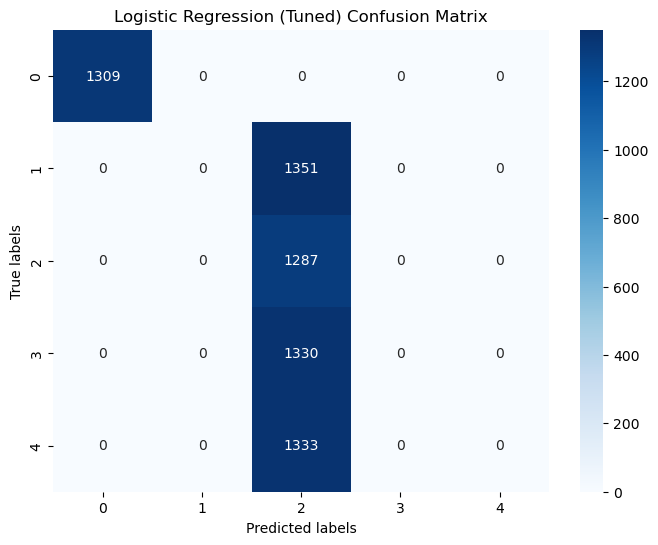


=== Random Forest (Tuned) ===
Best Params: N/A
              precision    recall  f1-score   support

           1       1.00      1.00      1.00      1309
           2       0.98      0.96      0.97      1351
           3       0.96      0.97      0.96      1287
           4       0.97      0.97      0.97      1330
           5       0.95      0.96      0.96      1333

    accuracy                           0.97      6610
   macro avg       0.97      0.97      0.97      6610
weighted avg       0.97      0.97      0.97      6610

ROC-AUC (OVR): 0.999


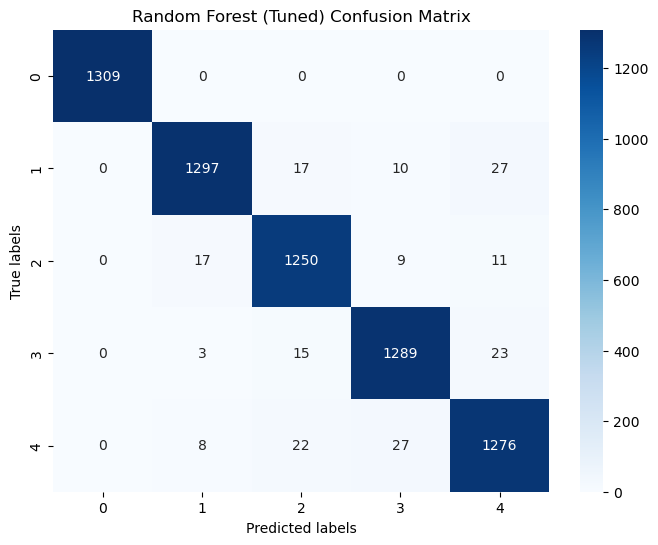


=== SVM (Tuned) ===
Best Params: N/A
              precision    recall  f1-score   support

           1       1.00      1.00      1.00      1309
           2       0.19      0.06      0.09      1351
           3       0.27      0.27      0.27      1287
           4       0.29      0.30      0.29      1330
           5       0.28      0.47      0.35      1333

    accuracy                           0.42      6610
   macro avg       0.41      0.42      0.40      6610
weighted avg       0.40      0.42      0.40      6610

ROC-AUC (OVR): 0.719


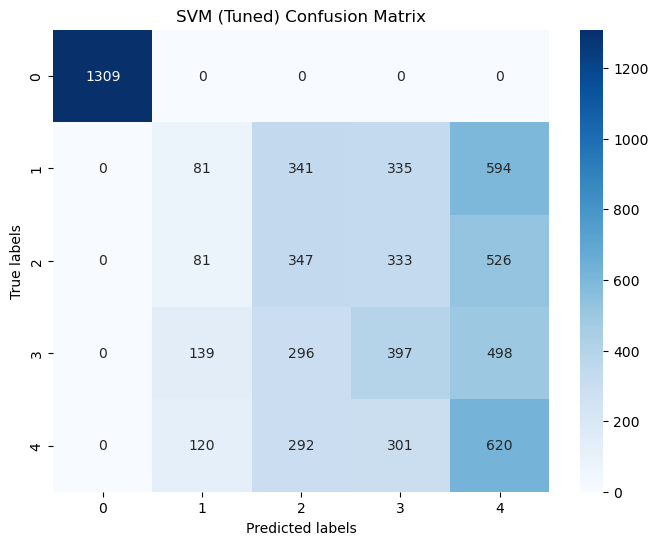

In [45]:
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

def evaluate_model(model, X_test, y_test, name):
    y_pred = model.predict(X_test)
    
    print(f"\n=== {name} ===")
    print("Best Params:", grid_search.best_params_ if 'grid_' in name.lower() else "N/A")
    print(classification_report(y_test, y_pred))
    
    # ROC-AUC calculation for multi-class
    if hasattr(model, "predict_proba"):
        y_proba = model.predict_proba(X_test)
        # For multi-class, we need to specify the multi_class parameter
        try:
            roc_auc = roc_auc_score(y_test, y_proba, multi_class='ovr')
            print(f"ROC-AUC (OVR): {roc_auc:.3f}")
        except ValueError:
            # If binary classification or other error
            print("Could not calculate ROC-AUC with OVR method")
    else:
        print("Model doesn't support predict_proba, skipping ROC-AUC")
    
    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f"{name} Confusion Matrix")
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.show()

# Evaluate all models
evaluate_model(best_log, X_test, y_test, "Logistic Regression (Tuned)")
evaluate_model(best_rf, X_test, y_test, "Random Forest (Tuned)")
evaluate_model(best_svm, X_test, y_test, "SVM (Tuned)")

In [46]:
from sklearn.ensemble import (
    RandomForestClassifier, AdaBoostClassifier, VotingClassifier
)
from sklearn.metrics import classification_report, confusion_matrix

from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier

In [47]:
models = {
    'Logistic Regression': LogisticRegression(max_iter=1000),
    'K-Nearest Neighbors': KNeighborsClassifier(),
    'Naive Bayes': GaussianNB()
}

results = {}
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    results[name] = accuracy_score(y_test, y_pred)

In [48]:
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)
results['Random Forest'] = accuracy_score(y_test, rf.predict(X_test))

In [49]:
ab = AdaBoostClassifier(n_estimators=50, random_state=42)
ab.fit(X_train, y_train)
results['AdaBoost'] = accuracy_score(y_test, ab.predict(X_test))

In [50]:
voting = VotingClassifier(estimators=[
    ('lr', LogisticRegression(max_iter=1000)),
    ('knn', KNeighborsClassifier()),
    ('nb', GaussianNB())
], voting='hard')

voting.fit(X_train, y_train)
results['Voting Ensemble'] = accuracy_score(y_test, voting.predict(X_test))


 Accuracy Summary:
                 Model  Accuracy
0  Logistic Regression  0.421785
1  K-Nearest Neighbors  0.594705
2          Naive Bayes  0.464750

Classification Report for Logistic Regression:

              precision    recall  f1-score   support

           1       1.00      1.00      1.00      1309
           2       0.24      0.22      0.23      1351
           3       0.29      0.30      0.30      1287
           4       0.29      0.36      0.32      1330
           5       0.29      0.25      0.26      1333

    accuracy                           0.42      6610
   macro avg       0.42      0.42      0.42      6610
weighted avg       0.42      0.42      0.42      6610


Classification Report for K-Nearest Neighbors:

              precision    recall  f1-score   support

           1       1.00      1.00      1.00      1309
           2       0.47      0.61      0.53      1351
           3       0.44      0.60      0.51      1287
           4       0.63      0.37      0.47 

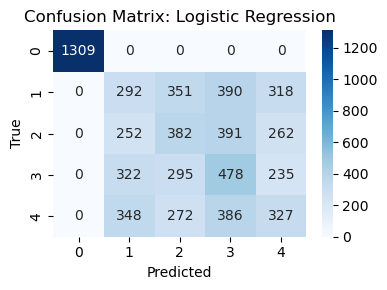

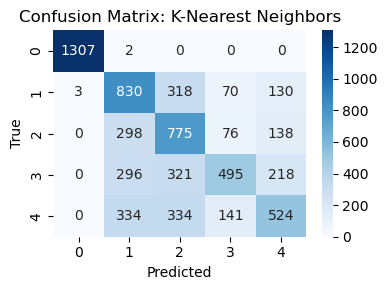

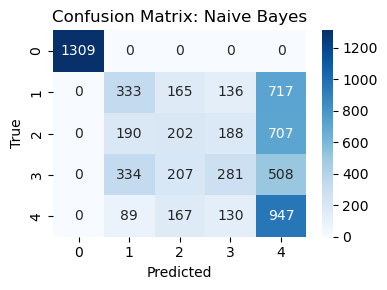

In [51]:
results = {}
reports = {}
conf_matrices = {}

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Accuracy
    acc = accuracy_score(y_test, y_pred)
    results[name] = acc

    # Classification report (dictionary format for later use)
    reports[name] = classification_report(y_test, y_pred, output_dict=True)

    # Confusion matrix
    conf_matrices[name] = confusion_matrix(y_test, y_pred)

# Summary table with Accuracy
results_df = pd.DataFrame(list(results.items()), columns=['Model', 'Accuracy'])
print("\n Accuracy Summary:")
print(results_df)

# Detailed classification reports
for name, report in reports.items():
    print(f"\nClassification Report for {name}:\n")
    print(classification_report(y_test, models[name].predict(X_test)))

# Confusion matrices
for name, matrix in conf_matrices.items():
    plt.figure(figsize=(4, 3))
    sns.heatmap(matrix, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix: {name}')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.tight_layout()
    plt.show()

 Hard Voting Accuracy: 0.5208774583963691
 Classification Report (Hard Voting):
              precision    recall  f1-score   support

           1       1.00      1.00      1.00      1309
           2       0.36      0.56      0.44      1351
           3       0.40      0.37      0.38      1287
           4       0.48      0.27      0.35      1330
           5       0.43      0.41      0.42      1333

    accuracy                           0.52      6610
   macro avg       0.53      0.52      0.52      6610
weighted avg       0.53      0.52      0.52      6610



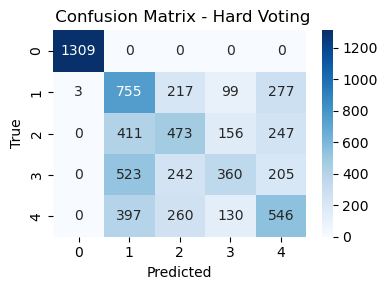


 Soft Voting Accuracy: 0.6236006051437216
 Classification Report (Soft Voting):
              precision    recall  f1-score   support

           1       1.00      1.00      1.00      1309
           2       0.57      0.48      0.53      1351
           3       0.59      0.48      0.53      1287
           4       0.68      0.37      0.48      1330
           5       0.44      0.79      0.56      1333

    accuracy                           0.62      6610
   macro avg       0.66      0.62      0.62      6610
weighted avg       0.65      0.62      0.62      6610



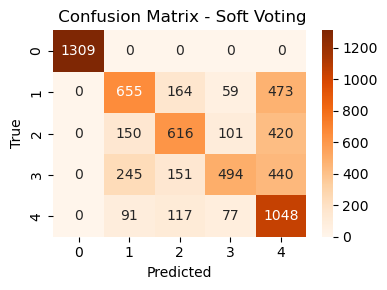

In [52]:
from sklearn.ensemble import VotingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns

# Define models
lr = LogisticRegression(max_iter=1000)
nb = GaussianNB()
knn = KNeighborsClassifier()

# Hard Voting
voting_hard = VotingClassifier(
    estimators=[('lr', lr), ('nb', nb), ('knn', knn)],
    voting='hard'
)

# Soft Voting
voting_soft = VotingClassifier(
    estimators=[('lr', lr), ('nb', nb), ('knn', knn)],
    voting='soft'
)

#Train & Evaluate Hard Voting 
voting_hard.fit(X_train, y_train)
y_pred_hard = voting_hard.predict(X_test)
print(" Hard Voting Accuracy:", accuracy_score(y_test, y_pred_hard))
print(" Classification Report (Hard Voting):")
print(classification_report(y_test, y_pred_hard))

plt.figure(figsize=(4, 3))
sns.heatmap(confusion_matrix(y_test, y_pred_hard), annot=True, fmt='d', cmap='Blues')
plt.title(' Confusion Matrix - Hard Voting')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.tight_layout()
plt.show()

#Train & Evaluate Soft Voting
voting_soft.fit(X_train, y_train)
y_pred_soft = voting_soft.predict(X_test)
print("\n Soft Voting Accuracy:", accuracy_score(y_test, y_pred_soft))
print(" Classification Report (Soft Voting):")
print(classification_report(y_test, y_pred_soft))

plt.figure(figsize=(4, 3))
sns.heatmap(confusion_matrix(y_test, y_pred_soft), annot=True, fmt='d', cmap='Oranges')
plt.title(' Confusion Matrix - Soft Voting')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.tight_layout()
plt.show()

In [53]:
from sklearn.ensemble import BaggingClassifier
from sklearn.linear_model import LogisticRegression

bagging_model = BaggingClassifier(
    estimator=LogisticRegression(max_iter=1000),
    n_estimators=10,
    random_state=42
)
bagging_model.fit(X_train, y_train)
print("Bagging Accuracy:", bagging_model.score(X_test, y_test))

Bagging Accuracy: 0.41785173978819967


In [54]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier

boosting_model = AdaBoostClassifier(
    estimator=DecisionTreeClassifier(max_depth=2),
    n_estimators=50,
    learning_rate=1.0,
    random_state=42
)
boosting_model.fit(X_train, y_train)
print("Boosting Accuracy:", boosting_model.score(X_test, y_test))

Boosting Accuracy: 0.5145234493192133


In [55]:
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier

# Define base learners
base_models = [
    ('lr', LogisticRegression(max_iter=1000)),
    ('knn', KNeighborsClassifier()),
    ('nb', GaussianNB())
]

# Meta-learner (final decision)
stacking_model = StackingClassifier(
    estimators=base_models,
    final_estimator=LogisticRegression(),
    cv=5
)

stacking_model.fit(X_train, y_train)
print("Stacking Accuracy:", stacking_model.score(X_test, y_test))

Stacking Accuracy: 0.67821482602118


In [56]:
# Define models
models = {
    "Bagging (LogReg)": BaggingClassifier(estimator=LogisticRegression(max_iter=1000), n_estimators=10, random_state=42),
    "Boosting (Tree)": AdaBoostClassifier(estimator=DecisionTreeClassifier(max_depth=2), n_estimators=50, random_state=42),
    "Stacking (LR+KNN+NB)": StackingClassifier(
        estimators=[
            ('lr', LogisticRegression(max_iter=1000)),
            ('knn', KNeighborsClassifier()),
            ('nb', GaussianNB())
        ],
        final_estimator=LogisticRegression(),
        cv=5
    ),
    "Voting (LR+KNN+NB)": VotingClassifier(
        estimators=[
            ('lr', LogisticRegression(max_iter=1000)),
            ('knn', KNeighborsClassifier()),
            ('nb', GaussianNB())
        ],
        voting='hard'
    )
}

# Collect metrics
summary = []
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    report = classification_report(y_test, y_pred, output_dict=True)
    summary.append({
        "Model": name,
        "Accuracy": accuracy_score(y_test, y_pred),
        "Precision": report['weighted avg']['precision'],
        "Recall": report['weighted avg']['recall'],
        "F1-score": report['weighted avg']['f1-score']
    })

df_summary = pd.DataFrame(summary)
print(df_summary)

                  Model  Accuracy  Precision    Recall  F1-score
0      Bagging (LogReg)  0.417852   0.415171  0.417852  0.414746
1       Boosting (Tree)  0.514523   0.525387  0.514523  0.510603
2  Stacking (LR+KNN+NB)  0.678215   0.676633  0.678215  0.677058
3    Voting (LR+KNN+NB)  0.520877   0.532406  0.520877  0.516159


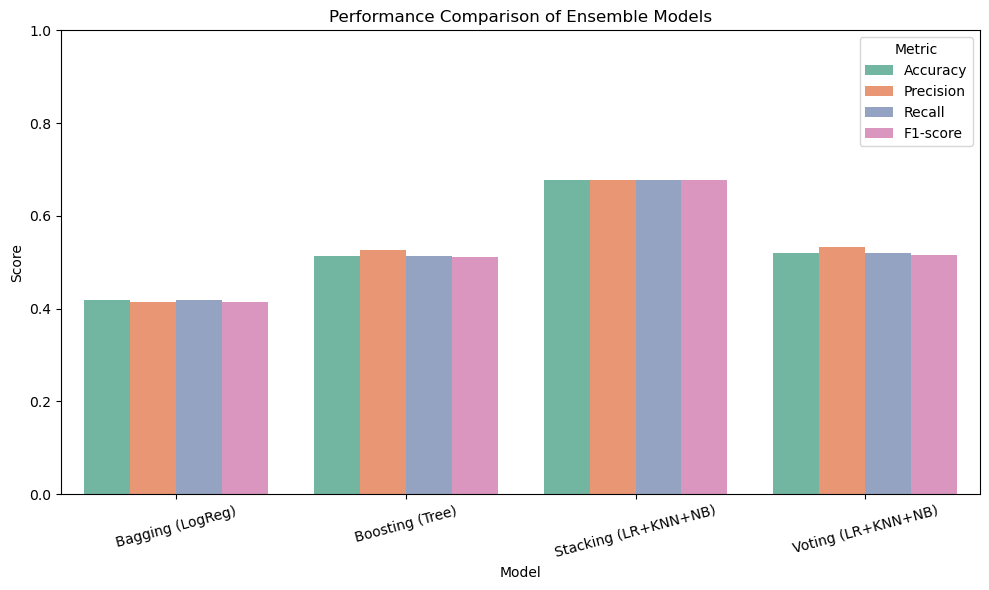

In [117]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Your full model comparison data
df = pd.DataFrame({
    "Model": ["Bagging (LogReg)", "Boosting (Tree)", "Stacking (LR+KNN+NB)", "Voting (LR+KNN+NB)"],
    "Accuracy": [0.417852,  0.514523, 0.678215, 0.520877],
    "Precision": [0.415171, 0.525387, 0.6766633, 0.532406],
    "Recall": [0.417852, 0.514523, 0.678215, 0.520877],
    "F1-score": [0.414746, 0.510603, 0.677058, 0.516159],
})

# Reshape the DataFrame for seaborn
df_melted = df.melt(id_vars="Model", var_name="Metric", value_name="Score")

# Plot everything
plt.figure(figsize=(10, 6))
sns.barplot(data=df_melted, x="Model", y="Score", hue="Metric", palette="Set2")
plt.title("Performance Comparison of Ensemble Models")
plt.xticks(rotation=15)
plt.ylim(0, 1)
plt.legend(title="Metric")
plt.tight_layout()
plt.show()

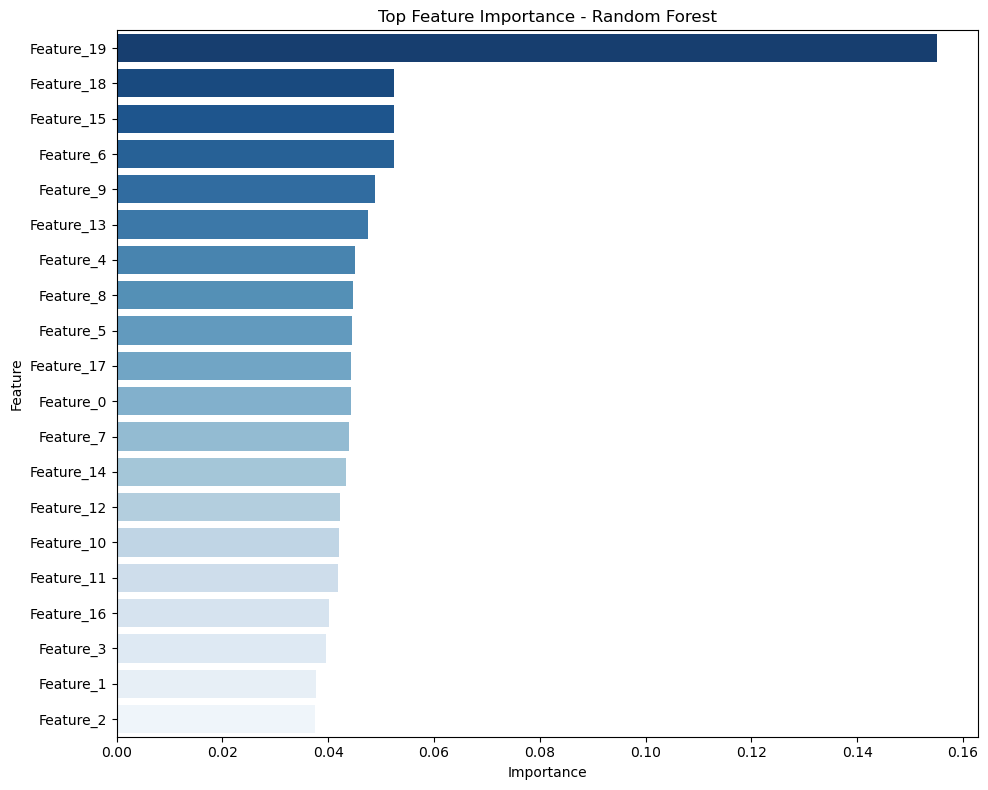

In [119]:
# If X_train is a numpy array, convert it to a pandas DataFrame
X_train_df = pd.DataFrame(X_train)
X_train_df.columns = [f'Feature_{i}' for i in range(X_train_df.shape[1])]

# Feature Importance - Random Forest
rf_importances = pd.DataFrame({
    'Feature': X_train_df.columns,
    'Importance': best_rf.feature_importances_
}).sort_values(by='Importance', ascending=False)

# Display top 20 features if there are many
top_n = min(20, len(rf_importances))
plt.figure(figsize=(10, 8))
sns.barplot(data=rf_importances.head(top_n), x='Importance', y='Feature', palette='Blues_r')
plt.title('Top Feature Importance - Random Forest')
plt.tight_layout()
plt.show()